In [1]:
import argparse
import torch
import time
from PIL import Image
import getpass

from multiplexer.config import cfg
from multiplexer.config.parser import override_cfg_from_arg_opts
from multiplexer.checkpoint import DetectionCheckpointer
from multiplexer.data import make_data_loader
from multiplexer.data.transforms import build_transforms
from multiplexer.engine.text_inference import compute_result_logs, load_image, render_box_multi_text
from multiplexer.modeling import build_model
from multiplexer.structures.image_list import to_image_list

In [2]:
user = getpass.getuser()
config_file = f"/private/home/{user}/code/ocr/multiplexer/aws/weights/PMLX1G/config.yaml"
model_weight = f"/private/home/{user}/code/ocr/multiplexer/aws/weights/PMLX1G/PMLX1G.pth"
img_dir = f"/checkpoint/{user}/datasets/MLT19/test/imgs/"

In [3]:
cfg.merge_from_file(config_file)

In [4]:
opts = ["MODEL.WEIGHT", model_weight]
cfg.merge_from_list(opts)

In [5]:
model = build_model(cfg)

In [6]:
model = model.to(cfg.MODEL.DEVICE)

In [7]:
checkpointer = DetectionCheckpointer(cfg, model)
_ = checkpointer.load(cfg.MODEL.WEIGHT)

In [8]:
model.eval()

GeneralizedRCNN(
  (backbone): Sequential(
    (body): ResNet(
      (stem): StemWithFixedBatchNorm(
        (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (bn1): FrozenBatchNorm2d()
      )
      (layer1): Sequential(
        (0): BottleneckWithFixedBatchNorm(
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
        )
        (1): BottleneckWithFixedBatchNorm(
          (conv1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): Fro

In [9]:
transforms = build_transforms(cfg, False)

In [10]:
def predict_on_image(image_path):
    image = load_image(image_path)
    img, _ = transforms(image, None)
    images = to_image_list(img, cfg.DATALOADER.SIZE_DIVISIBILITY)
    images = images.to(cfg.MODEL.DEVICE)

    with torch.no_grad():
        prediction_dict = model(images)
        
    global_prediction = prediction_dict["global_prediction"][0]
    test_image_width, test_image_height = global_prediction.size

    img = load_image(image_path)
    width, height = img.size
    resize_ratio = float(height) / test_image_height
    global_prediction = global_prediction.resize((width, height))
    prediction_dict["rotated_boxes_5d"] = None
    prediction_dict["boxes"] = global_prediction.bbox.tolist()
    use_seg_poly = cfg.MODEL.SEG.USE_SEG_POLY
    if cfg.MODEL.TRAIN_DETECTION_ONLY:
        prediction_dict["scores"] = [1.0 for _ in range(len(global_prediction))]  # dummy
        use_seg_poly = True
        prediction_dict["masks"] = global_prediction.get_field("masks").get_polygons()
    else:
        if cfg.MODEL.ROI_BOX_HEAD.INFERENCE_USE_BOX:
            prediction_dict["scores"] = global_prediction.get_field("scores").tolist()
        if not use_seg_poly:
            prediction_dict["masks"] = global_prediction.get_field("mask").cpu().numpy()
        else:
            prediction_dict["masks"] = global_prediction.get_field("masks").get_polygons()

    polygon_format = "polygon"
    result_logs_dict = compute_result_logs(
        prediction_dict=prediction_dict,
        cfg=cfg,
        img=img,
        polygon_format=polygon_format,
        use_seg_poly=use_seg_poly,
    )
    result_logs = result_logs_dict["result_logs"]
    
    img_vis = img.copy()
    render_box_multi_text(
        cfg=cfg,
        image=img_vis,
        result_logs_dict=result_logs_dict,
        resize_ratio=resize_ratio,
    )
    
    return img_vis

[Info] fonts initiated.


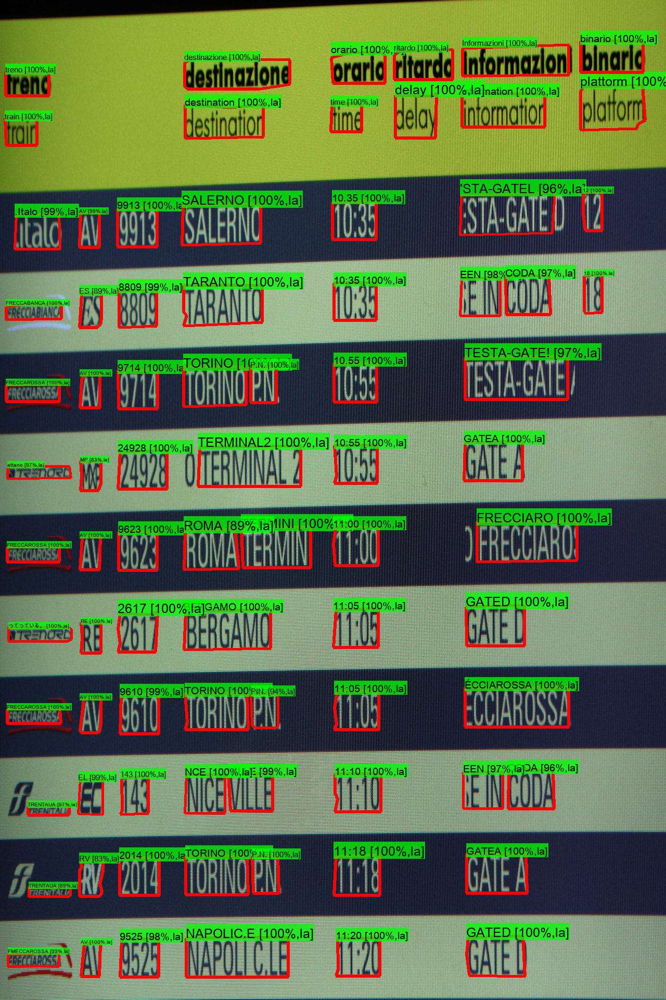

In [11]:
predict_on_image(img_dir + "ts_img_00093.jpg")

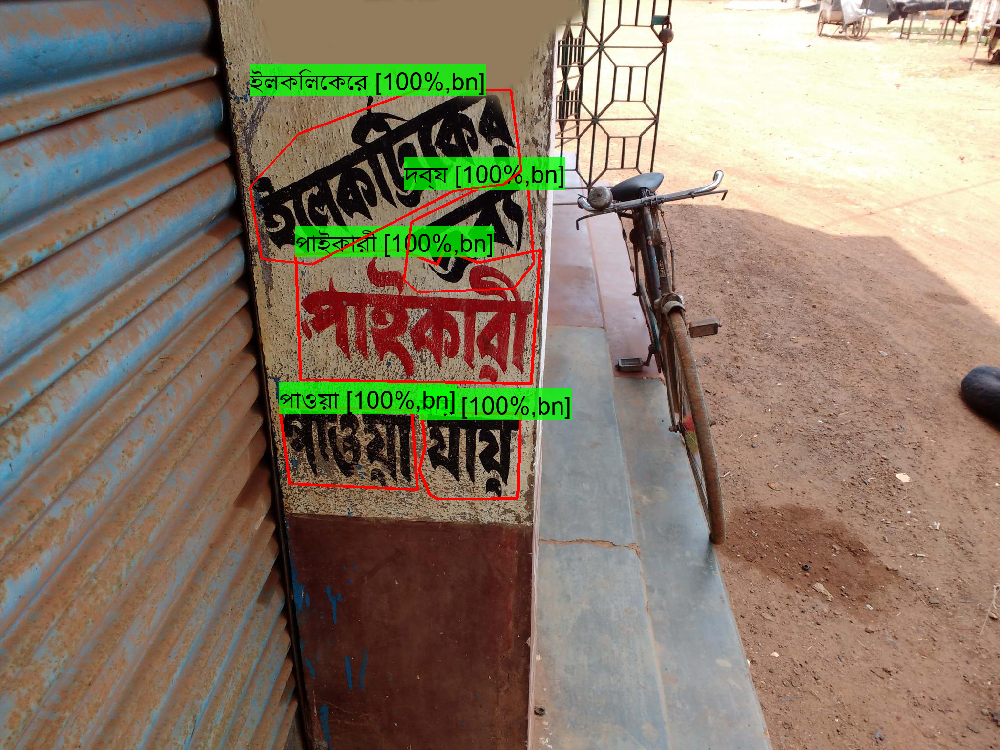

In [12]:
predict_on_image(img_dir + "ts_img_00096.jpg")

In [ ]:
predict_on_image(img_dir + "ts_img_00108.jpg")

In [ ]:
predict_on_image(img_dir + "ts_img_00137.jpg")

In [ ]:
predict_on_image(img_dir + "ts_img_00176.jpg")